In [1]:
#imports
import clip
import copy
import cv2
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from PIL import Image
import requests
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.profiler import profile, record_function, ProfilerActivity
import torchvision
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision.transforms import autoaugment
from tqdm import tqdm

# Question 3

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

## Load Model

In [3]:
resnet_model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1).to(device)
resnet_model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [4]:
clip_model, clip_preprocess = clip.load("RN50", device=device)
clip_model.eval()

CLIP(
  (visual): ModifiedResNet(
    (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu3): ReLU(inplace=True)
    (avgpool): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
     

## Classes and Prompts

In [5]:
imagenet_preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

imagenet_classes_url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
response = requests.get(imagenet_classes_url)
imagenet_classes = response.text.strip().split("\n")
imagenet_prompts = [f"a photo of a {label}" for label in imagenet_classes]

text_inp = clip.tokenize(imagenet_prompts).to(device)

In [6]:
with torch.no_grad():
    text_features = clip_model.encode_text(text_inp)
    text_features /= text_features.norm(dim=-1, keepdim=True)

## CLIP inference

In [7]:
def classify_CLIP(image_path, model=clip_model, text_features=text_features):
    img = Image.open(image_path)
    image = clip_preprocess(img).unsqueeze(0).to(device)
    display(img)
    
    with torch.no_grad():
        image_features = model.encode_image(image)
        
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)
    
    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    values, indices = similarity[0].topk(5)
    
    print("\nTop predictions:\n")
    for value, index in zip(values, indices):
        print(f"{imagenet_classes[index]}: {100 * value.item():.2f}%")
    print()
    
    return imagenet_classes[indices[0]], values[0].item()

In [8]:
def predict_rn50(image_path):
    image = Image.open(image_path).convert('RGB')
    display(image)
    input_tensor = imagenet_preprocess(image).unsqueeze(0).to(device)
    with torch.no_grad():
        outputs = resnet_model(input_tensor)
        probs = torch.nn.functional.softmax(outputs[0], dim=0)

    top5 = torch.topk(probs, 5)
    for idx, score in zip(top5.indices, top5.values):
        print(f"{imagenet_classes[idx]}: {score:.4f}")

In [9]:
image_dir = "dataset/data_full"
image_paths = []
for root, _, files in os.walk(image_dir):
    for file in files:
        if file.endswith(('.jpg', '.JPEG', '.png')):
            image_paths.append(os.path.join(root, file))
print(f"Found {len(image_paths)} images in {image_dir}")

Found 1000 images in dataset/data_full


### CLIP Inference

Image dataset/data_full/n02124075_Egyptian_cat.JPEG - CLIP:


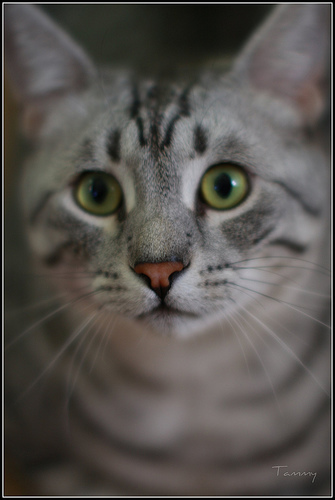


Top predictions:

tiger cat: 19.32%
tabby: 13.92%
Madagascar cat: 8.31%
Siamese cat: 7.93%
Persian cat: 6.18%

Image dataset/data_full/n02488702_colobus.JPEG - CLIP:


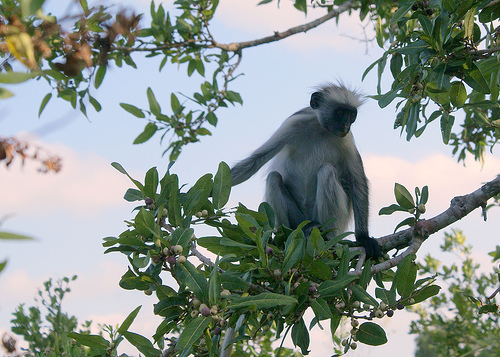


Top predictions:

langur: 81.05%
macaque: 5.78%
colobus: 4.57%
gibbon: 2.06%
spider monkey: 1.94%



In [10]:
for image_path in image_paths[20:22]:
    print(f"Image {image_path} - CLIP:")
    classify_CLIP(image_path)

### RN50 Inference

Image dataset/data_full/n02124075_Egyptian_cat.JPEG - ResNet50:


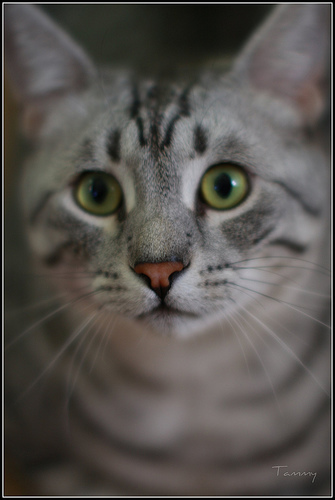

Egyptian cat: 0.8670
tabby: 0.0766
tiger cat: 0.0522
lynx: 0.0036
snow leopard: 0.0001
Image dataset/data_full/n02488702_colobus.JPEG - ResNet50:


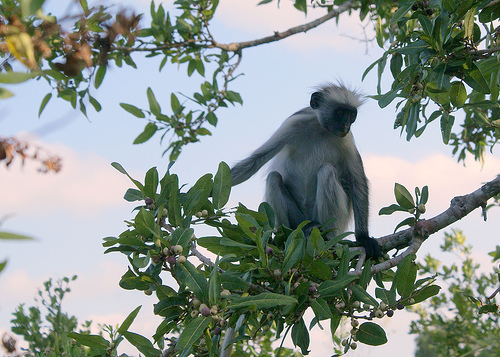

colobus: 0.9616
langur: 0.0351
guenon: 0.0018
patas: 0.0003
spider monkey: 0.0003


In [11]:
for image_path in image_paths[20:22]:
    print(f"Image {image_path} - ResNet50:")
    predict_rn50(image_path)

## CLIP vs ImageNet pretraining

In [12]:
# Selected ImageNet Classes
selected_classes = [
    "stingray",
    "goldfinch",
    "cheeseburger",
    "robin",
    "lion",
    "pretzel",
    "volcano",
    "volleyball",
    "submarine",
    "bubble"
]

In [13]:
def clip_predictions(image_path, gt_labels):

    predicted_labels = []
    correct_preds = 0

    for i in range(len(image_path)):

        image = Image.open(image_path[i]).convert("RGB")
        img = clip_preprocess(image).unsqueeze(0).to(device)

        with torch.no_grad():
            img_features = clip_model.encode_image(img)
            img_features /= img_features.norm(dim=-1, keepdim=True)

            logits_per_image = (100.0 * img_features @ text_features.T)
            probs = logits_per_image.softmax(dim=-1)

            top_probs, top_indices = probs[0].topk(5)
            top_5_preds = [imagenet_classes[idx] for idx in top_indices]

        gt_label = gt_labels[i]
        if gt_label in top_5_preds:
            predicted_labels.append((gt_label, top_5_preds.index(gt_label)))
            correct_preds += 1
        else:
            predicted_labels.append((-1, -1))

    accuracy = round(correct_preds / len(gt_labels) * 100, 2)
    return predicted_labels, accuracy


In [14]:
def rn50_predictions(image_paths, gt_labels):
    predicted_labels = []
    correct_preds = 0
    
    for i in range(len(image_paths)):
        image = Image.open(image_paths[i]).convert("RGB")
        img = imagenet_preprocess(image).unsqueeze(0).to(device)
        
        with torch.no_grad():
            output = resnet_model(img)
            probs = F.softmax(output, dim=1)
            top_probs, top_labels = probs[0].topk(5)
            top_5_preds = [imagenet_classes[label.item()] for label in top_labels]

        gt_label = gt_labels[i]
        if gt_label in top_5_preds:
            predicted_labels.append((gt_label, top_5_preds.index(gt_label)))
            correct_preds += 1
        else:
            predicted_labels.append((-1, -1))

    accuracy = round(correct_preds / len(gt_labels) * 100, 2)
    return predicted_labels, accuracy

### CLIP > ImageNet

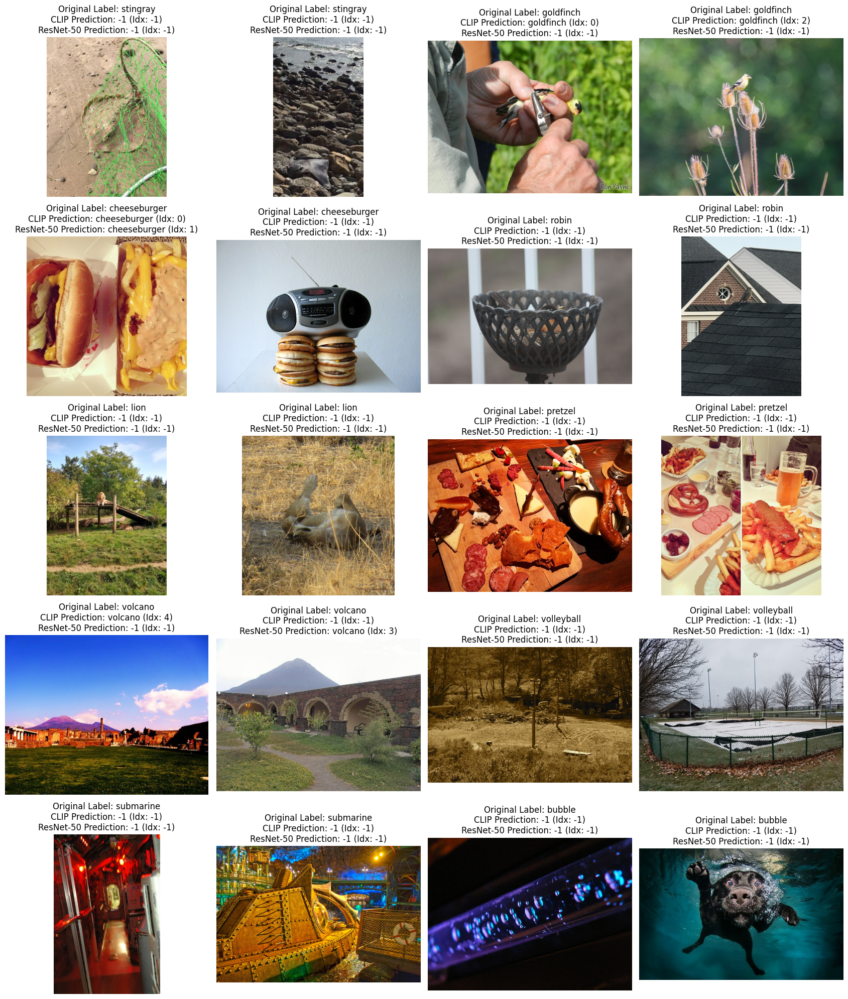

CLIP Accuracy = 20.0%
ResNet-50 Accuracy = 10.0%


In [15]:
img_dir = "dataset/data_clip"
images_path_new, images_new, gt_labels = [], [], []

for label in selected_classes:
    for i in range(1, 3):
        img_path = os.path.join(img_dir, f"{label}_{i}.jpg")
        if os.path.exists(img_path):
            img = Image.open(img_path).convert("RGB")
            images_new.append(img)
            images_path_new.append(img_path)
            gt_labels.append(label)

clip_res, clip_acc = clip_predictions(images_path_new, gt_labels)
resnet_res, rn50_acc = rn50_predictions(images_path_new, gt_labels)

fig, axes = plt.subplots(5, 4, figsize=(17, 20))

for i, ax in enumerate(axes.flatten()):
    ax.imshow(images_new[i])
    ax.axis('off')
    ax.set_title(f"Original Label: {gt_labels[i]}\n"
                 f"CLIP Prediction: {clip_res[i][0]} (Idx: {clip_res[i][1]})\n"
                 f"ResNet-50 Prediction: {resnet_res[i][0]} (Idx: {resnet_res[i][1]})")

plt.tight_layout()
plt.show()

print(f"CLIP Accuracy = {clip_acc}%")
print(f"ResNet-50 Accuracy = {rn50_acc}%")


### CLIP < ImageNet

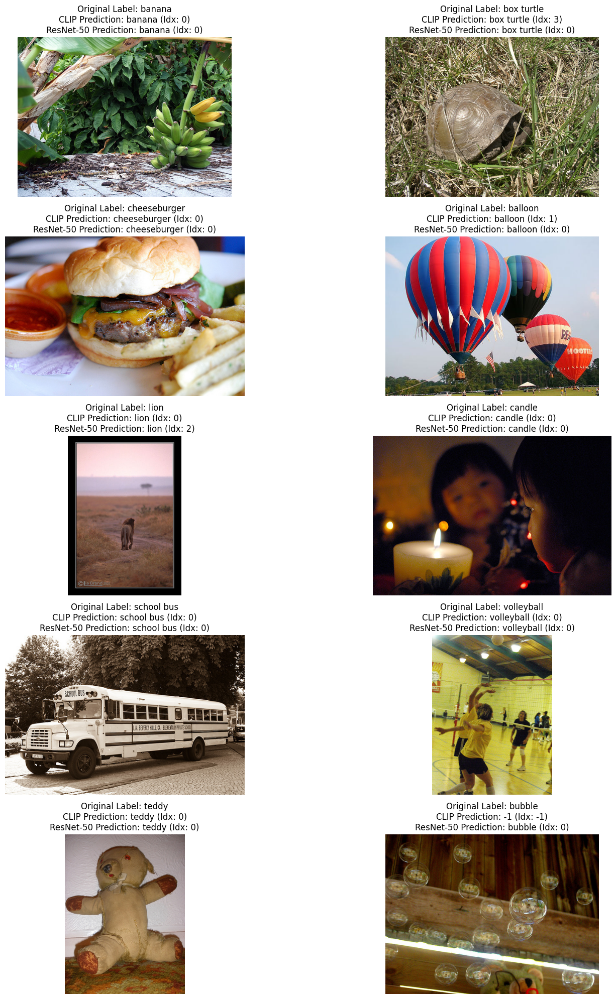

CLIP Accuracy = 90.0%
ResNet-50 Accuracy = 100.0%


In [16]:
selected_classes_RN50 = [
    "banana",
    "box turtle",
    "cheeseburger",
    "balloon",
    "lion",
    "candle",
    "school bus",
    "volleyball",
    "teddy",
    "bubble"
]

img_dir = "dataset/data_rn50"
images_path_new, images_new, gt_labels = [], [], []

for label in selected_classes_RN50:
    img_path = os.path.join(img_dir, f"{label}.JPEG")
    if os.path.exists(img_path):
        img = Image.open(img_path).convert("RGB")
        images_new.append(img)
        images_path_new.append(img_path)
        gt_labels.append(label)

clip_res, clip_acc = clip_predictions(images_path_new, gt_labels)
resnet_res, rn50_acc = rn50_predictions(images_path_new, gt_labels)

fig, axes = plt.subplots(5, 2, figsize=(17, 20))

for i, ax in enumerate(axes.flatten()):
    ax.imshow(images_new[i])
    ax.axis('off')
    ax.set_title(f"Original Label: {gt_labels[i]}\n"
                 f"CLIP Prediction: {clip_res[i][0]} (Idx: {clip_res[i][1]})\n"
                 f"ResNet-50 Prediction: {resnet_res[i][0]} (Idx: {resnet_res[i][1]})")

plt.tight_layout()
plt.show()

print(f"CLIP Accuracy = {clip_acc}%")
print(f"ResNet-50 Accuracy = {rn50_acc}%")


## FP16

In [17]:
fp16_model = copy.deepcopy(clip_model)
fp16_model.to(torch.float16)

CLIP(
  (visual): ModifiedResNet(
    (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu3): ReLU(inplace=True)
    (avgpool): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
     

In [18]:
def measure_difference(image_path):
    img = Image.open(image_path)
    image = clip_preprocess(img).unsqueeze(0).to(device)

    def measure_inference_time(model):
        start_time = time.time()
        for _ in range(100):
            _ = model.encode_image(image)
        end_time = time.time()
        return end_time - start_time

    fp32_time = measure_inference_time(clip_model)
    fp16_time = measure_inference_time(fp16_model)
    time_difference = fp32_time - fp16_time

    return fp32_time, fp16_time, time_difference


fp32_time, fp16_time, time_difference = measure_difference(image_paths[0])

print(f"Inference time (fp32): {fp32_time:.4f} seconds")
print(f"Inference time (fp16): {fp16_time:.4f} seconds")
print(f"Time difference (fp32 - fp16): {time_difference:.4f} seconds")

Inference time (fp32): 0.2746 seconds
Inference time (fp16): 0.3293 seconds
Time difference (fp32 - fp16): -0.0547 seconds


Done with 10 images
Done with 20 images
Done with 30 images
Done with 40 images
Done with 50 images
Done with 60 images
Done with 70 images
Done with 80 images
Done with 90 images
Done with 100 images


Text(0.5, 1.0, 'Difference between the fp32 (original) model and the fp16 model')

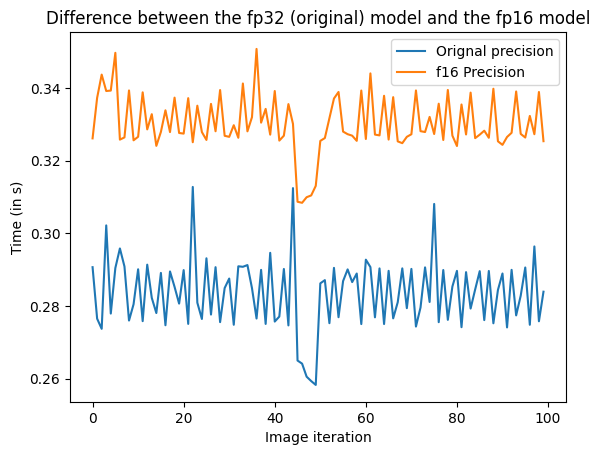

In [19]:
i = 0
f32_time = []
f16_time = []

while i<100:
    path = image_paths[i]
    f32, f16, t = measure_difference(path)
    f32_time.append(f32)
    f16_time.append(f16)
    i+=1
    if i%10==0:
        print(f'Done with {i} images')

plt.xlabel('Image iteration')
plt.ylabel('Time (in s)')
plt.plot(f32_time, label='Orignal precision')
plt.plot(f16_time, label='f16 Precision')
plt.legend()
plt.title('Difference between the fp32 (original) model and the fp16 model')

In [20]:
difference = np.array(f32_time) - np.array(f16_time)

print(f'The mean in the differences of time (f32-f16) is : {np.mean(difference)}')
print(f'The standard deviation in the differences of time (f32-f16) is : {np.std(difference)}')

The mean in the differences of time (f32-f16) is : -0.046675570011138916
The standard deviation in the differences of time (f32-f16) is : 0.012088493970264623


In [21]:
def classify_f16CLIP(image_path, text_features=text_features):
    img = Image.open(image_path)
    image = clip_preprocess(img).unsqueeze(0).to(device)
    display(img)
    
    with torch.no_grad():
        image_features = fp16_model.encode_image(image)
        
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)
    
    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    values, indices = similarity[0].topk(5)
    
    print("\nTop predictions:\n")
    for value, index in zip(values, indices):
        print(f"{imagenet_classes[index]}: {100 * value.item():.2f}%")
    print()
    
    return imagenet_classes[indices[0]], values[0].item()

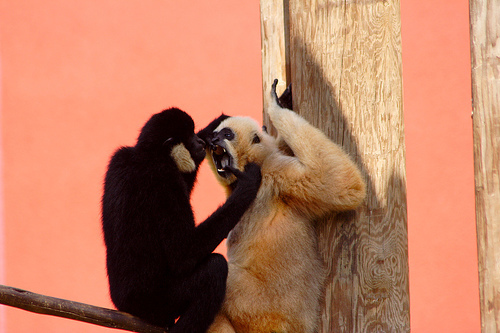


Top predictions:

gibbon: 44.56%
langur: 34.18%
indri: 6.12%
capuchin: 5.85%
spider monkey: 1.30%



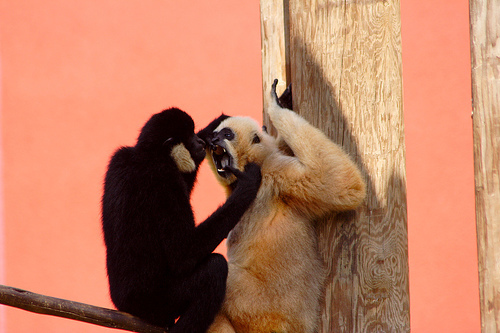


Top predictions:

gibbon: 44.60%
langur: 34.20%
indri: 6.13%
capuchin: 5.94%
spider monkey: 1.26%




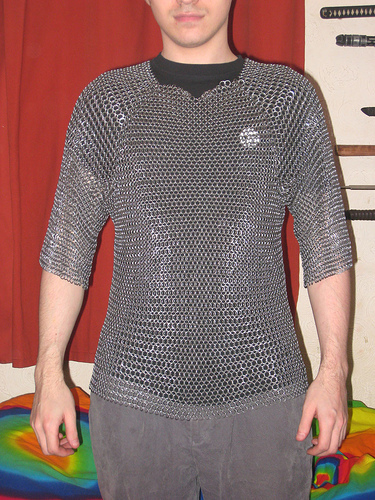


Top predictions:

bulletproof vest: 48.12%
sweatshirt: 7.38%
military uniform: 7.38%
cardigan: 5.23%
Cardigan: 5.23%



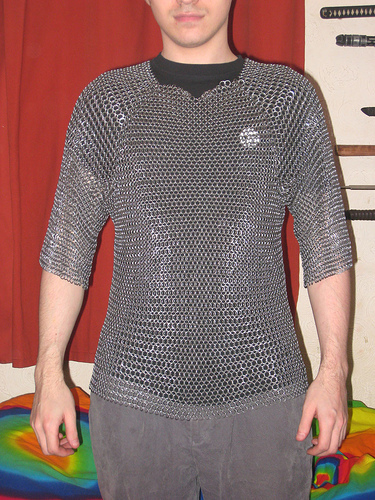


Top predictions:

bulletproof vest: 47.97%
military uniform: 7.36%
sweatshirt: 7.24%
cardigan: 5.22%
Cardigan: 5.22%




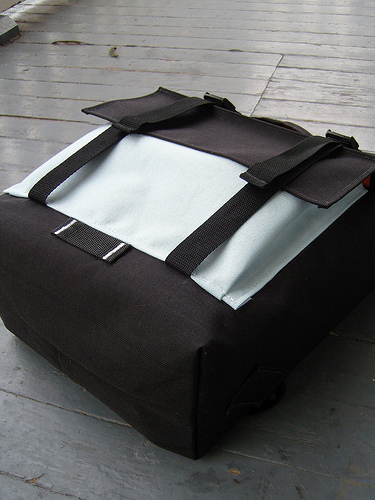


Top predictions:

backpack: 44.07%
bulletproof vest: 16.99%
bassinet: 15.95%
mailbag: 2.30%
sleeping bag: 1.97%



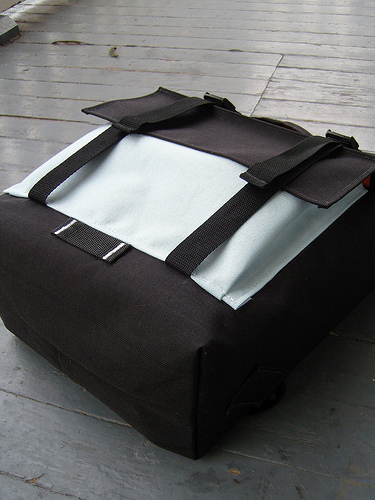


Top predictions:

backpack: 44.68%
bulletproof vest: 16.96%
bassinet: 15.67%
mailbag: 2.19%
sleeping bag: 1.96%




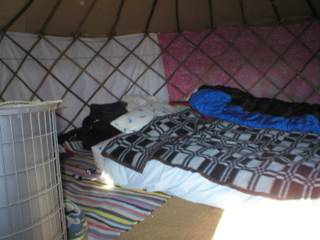


Top predictions:

wardrobe: 17.13%
yurt: 10.07%
maillot: 4.91%
maillot: 4.91%
sarong: 4.47%



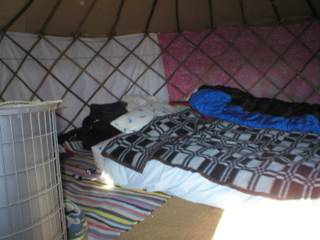


Top predictions:

wardrobe: 17.71%
yurt: 10.25%
maillot: 4.92%
maillot: 4.92%
sarong: 4.34%




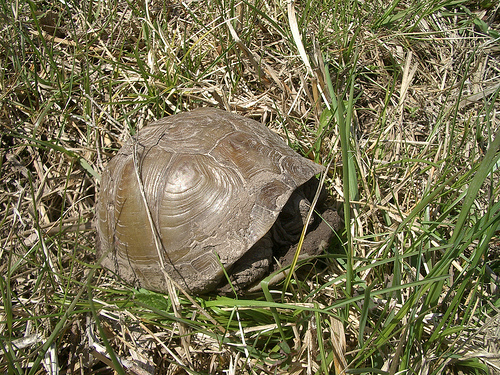


Top predictions:

mud turtle: 44.34%
terrapin: 19.07%
buckeye: 14.86%
box turtle: 12.71%
trilobite: 0.75%



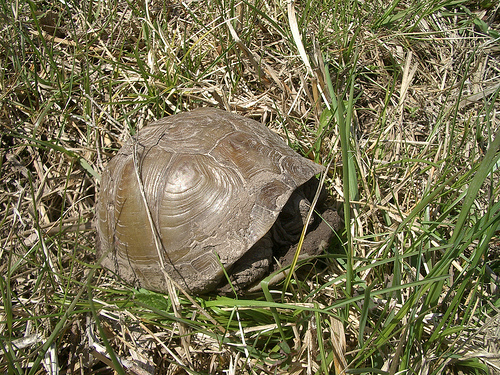


Top predictions:

mud turtle: 44.21%
terrapin: 19.31%
buckeye: 14.81%
box turtle: 12.67%
trilobite: 0.75%




In [22]:
image_list = []

i = 0
while i < 5:
    path = image_paths[i]
    classify_CLIP(path)
    classify_f16CLIP(path)
    print()
    i += 1
    

In [23]:
image = clip_preprocess(Image.open(image_paths[0])).unsqueeze(0).to(device)

clip_model.visual.float()

with profile(activities=[ProfilerActivity.CUDA],
             record_shapes=True,
             profile_memory=True,
             with_stack=True) as prof:

    with torch.no_grad():
        with record_function("model_inference"):
            _ = clip_model.encode_image(image)

# Move row_limit inside the table() method call
print(prof.key_averages().table(sort_by="cuda_memory_usage", row_limit=10))

-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                                   Name    Self CPU %      Self CPU   CPU total %     CPU total  CPU time avg     Self CUDA   Self CUDA %    CUDA total  CUDA time avg       CPU Mem  Self CPU Mem      CUDA Mem  Self CUDA Mem    # of Calls  
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                               [memory]         0.00%       0.000us         0.00%       0.000us       0.000us       0.000us         0.00%       0.000us       0.000us           0 b           0 b       4.00 Kb       4.00 K

[W423 16:59:01.270251462 collection.cpp:992] Warning: Failed to recover relationship between all profiler and kineto events: 359 vs. 0  reassociated. (function reassociate)


In [24]:
clip_model.visual.half()

# Run the profiler
with profile(activities=[ProfilerActivity.CUDA],
             record_shapes=True,
             profile_memory=True,
             with_stack=True) as prof:

    with torch.no_grad():
        with record_function("model_inference"):
            _ = clip_model.encode_image(image)

# Print summarized report
print(prof.key_averages().table(sort_by="cuda_memory_usage", row_limit=10))

-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                                   Name    Self CPU %      Self CPU   CPU total %     CPU total  CPU time avg     Self CUDA   Self CUDA %    CUDA total  CUDA time avg       CPU Mem  Self CPU Mem    # of Calls  
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                       cudaLaunchKernel        30.79%     730.324us        30.79%     730.324us       2.200us       0.000us         0.00%       0.000us       0.000us           0 b           0 b           332  
                                        cudaEventRecord         1.31%      31.148us         1.3

[W423 16:59:01.330385048 collection.cpp:992] Warning: Failed to recover relationship between all profiler and kineto events: 582 vs. 0  reassociated. (function reassociate)


## Model Architectures

### ResNet-50 (ImageNet):
- Model loaded from torchvision.models with ImageNet pretrained weights
- Series of Conv layers, BatchNorm layers, Activation functions, all wrapped in residual blocks
- 50 layers which includes the initial convolutional layer, residual blocks, and final fc layer for classification

### CLIP Visual Encoder
- Model loaded from OpenAI CLIP repository - visual encoder and text encoder
- Vision Transformer Architecture based on self attention mechanisms
- Series of transformer encoder blocks - multi head self attenstion and feedforward neural nets
- Input is divided into patches to form linear embeddings with position embeddings

### Differences
- Convolutional vs Transformer: ResNet-50 relies on the concept of convolution to extract features whereas CLIP relies on the idea of self attention on embeddings from the image to capture relations between patches
- Depth and Structure: ResNet-50 has 50 layers of residual blocks with skip connections whereas CLIP has transformer encoder blocks which internally work with self attention and feed forward net
- Pretraining: ResNet-50 is commonly pretrained on ImageNet dataset i.e. classification tasks whereas CLIP is pretrained on a large scale dataset which tries to lear a join representation space for images and text.

## About the ImageNet dataset

### Label Hierarchy
- WordNet hierarchy for organizing labels
- WordNet is a lexical database, grouping words into sets of cognitive synonyms - synsets
- Each synset represents distinct concepts and has an identifier WordNet ID (wnid)
- Synsets are organized hierarchically, going from general to specific as we go down
- dog -> retriever, poodle, terrier

### Synset Meaning
- Group of words that are semantically equivalent and occasionally interchangeable
- Usually a visual concept or object category
- Has a definition or gloss describing the concept
- dog -> a domesticated mammal related to wolves, often kept as a pet or for work

### Problem with Synset based object grouping
- Visual diversity - dog as a category has many breeds with a variety of visual features
- Contextual ambiguity - keyboard could mean the musical instrument or the computer peripheral, creating an ambiguity in the category
- Fine grained distinction - synsets may not capture fine grained distinction between similar objects like different species of birds

### Types of visual differences within a synset
- Appearance variation - car category has different car models with different shapes, colors, sizes
- Pose and viewpoint - chair looks different from front, side, back each capturing different details and aspects of it
- Occlusion and truncation - person may have the full body shown or parts of the body hidden by other objects